In [18]:
#Reading 3 zipped datasets from Google Drive and unzipping them

from google.colab import drive
drive.mount('/content/drive')

import zipfile
import os

# Specify the path to the folder in your Google Drive after adding a shortcut
drive_folder_path = '/content/drive/MyDrive/Recyclo/datasets'

# List to store the names of found zip files
found_zip_files = []

# Initialize the list to store extracted dataset names before the loop
extracted_dataset_names = []

# Check if the directory exists before listing its contents
if not os.path.exists(drive_folder_path):
    print(f"Error: The directory '{drive_folder_path}' was not found.")
    print("Please ensure you have added a shortcut to the shared folder in your 'My Drive' and the path is correct.")
else:
    # List all files in the folder
    for filename in os.listdir(drive_folder_path):
      if filename.endswith(".zip"):
        # Add the found zip file name to the list
        found_zip_files.append(filename)

        zip_path = os.path.join(drive_folder_path, filename)

        # Create a directory to extract to (optional)
        # Ensure the filename is clean for directory naming
        safe_filename = filename.replace('.zip', '')
        extract_path = f'/content/{safe_filename}_extracted'
        # Append the extracted path to the list within the loop
        extracted_dataset_names.append(extract_path)

        os.makedirs(extract_path, exist_ok=True)

        # Open the zip file
        try:
            with zipfile.ZipFile(zip_path, 'r') as zip_ref:
              # Extract all the contents into the specified directory
              zip_ref.extractall(extract_path)
              print(f"Extracted {filename} to {extract_path}")
        except zipfile.BadZipFile:
            print(f"Error: {filename} is not a valid zip file.")
        except FileNotFoundError:
             print(f"Error: Zip file not found at {zip_path}. This is unexpected after listing the directory.")

# Optional: Print the list of found zip files after the loop
print("\nFound the following zip files:")
for zip_name in found_zip_files:
    print(f"- {zip_name}")

print("\nExtracted dataset names:")
for name in extracted_dataset_names:
  print(f"- {name}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Extracted 20250602z_mju-waste_yolo.zip to /content/20250602z_mju-waste_yolo_extracted
Extracted 20250603_TACO_yolo_1500.zip to /content/20250603_TACO_yolo_1500_extracted
Extracted 20250610_aquatrash_yolo.zip to /content/20250610_aquatrash_yolo_extracted

Found the following zip files:
- 20250602z_mju-waste_yolo.zip
- 20250603_TACO_yolo_1500.zip
- 20250610_aquatrash_yolo.zip

Extracted dataset names:
- /content/20250602z_mju-waste_yolo_extracted
- /content/20250603_TACO_yolo_1500_extracted
- /content/20250610_aquatrash_yolo_extracted


In [24]:
"""import shutil
import os

# List of directories to delete
directories_to_delete = [
    '/content/20250602z_mju-waste_yolo_extracted',
    '/content/20250610_aquatrash_yolo_extracted',
    '/content/20250603_TACO_yolo_1500_extracted',
    '/content/merged_yolo_dataset_reshuffled'
    ] # Replace with your actual list of folder paths

for directory_path in directories_to_delete:
    if os.path.exists(directory_path):
        try:
            shutil.rmtree(directory_path)
            print(f"Deleted directory and its contents: {directory_path}")
        except OSError as e:
            print(f"Error deleting directory {directory_path}: {e}")
    else:
        print(f"Directory not found: {directory_path}")"""

Directory not found: /content/20250602z_mju-waste_yolo_extracted
Directory not found: /content/20250610_aquatrash_yolo_extracted
Directory not found: /content/20250603_TACO_yolo_1500_extracted
Deleted directory and its contents: /content/merged_yolo_dataset_reshuffled


In [23]:
"""import os

# Specify the path to the zip file you want to delete
zip_file_path = '/content/merged_yolo_dataset_reshuffled.zip' # Replace with the actual filename

# Check if the file exists before attempting to delete
if os.path.exists(zip_file_path):
    try:
        # Delete the file
        os.remove(zip_file_path)
        print(f"Deleted: {zip_file_path}")
    except OSError as e:
        print(f"Error deleting {zip_file_path}: {e}")
else:
    print(f"File not found: {zip_file_path}")"""

File not found: /content/merged_yolo_dataset_reshuffled.zip


In [19]:
"""
-Shuffles all image and labels from all 3 datasets and does another global
train, val, test split once all 3 are merged.
-Maps all labels to a single one, "trash".
-Keeps dataset name prefixes in all image and label names.
-Creates a .yaml file for the merged dataset.
- Skips 8 images with no label files from the 20250602z_mju-waste_yolo dataset.

"""
# %%
import os
import shutil
import yaml
import random

# --- Configuration ---
# List of paths to the extracted YOLO datasets.
# This list is now populated correctly from the previous code block.

extracted_yolo_dataset_paths = [
    '/content/20250602z_mju-waste_yolo_extracted',
    '/content/20250603_TACO_yolo_1500_extracted',
    '/content/20250610_aquatrash_yolo_extracted/kaggle/working/AquaTrash_yolo'
    ]

# Output directory for the merged YOLO dataset
merged_output_dir = '/content/merged_yolo_dataset_reshuffled' # Using a new directory name to avoid conflicts

# Define a mapping for merging class names
# Key: original class name from a dataset
# Value: the desired class name in the merged dataset
class_name_mapping = {
    'Rubbish': 'trash',
    'trash': 'trash',
    'glass': 'trash',
    'metal': 'trash',
    'paper': 'trash',
    'plastic': 'trash'
}

# Define the desired split ratios
train_split_ratio = 0.8
val_split_ratio = 0.1
test_split_ratio = 0.1 # The remaining

# --- Merging Process ---

# Create the main merged directories
merged_images_base = os.path.join(merged_output_dir, 'images')
merged_labels_base = os.path.join(merged_output_dir, 'labels')

# Create train, val, test subdirectories within the merged structure
for subdir in ['train', 'val', 'test']:
    os.makedirs(os.path.join(merged_images_base, subdir), exist_ok=True)
    os.makedirs(os.path.join(merged_labels_base, subdir), exist_ok=True)

# Keep track of encountered class names and map them to new indices
class_names_set = set()
merged_class_names = []
class_name_to_id = {}
next_class_id = 0

# List to store all image-label file pairs
all_files = []

print("Collecting all image and label file paths...")

for dataset_path in extracted_yolo_dataset_paths:
    print(f"Processing dataset: {dataset_path}")

    # Extract a simple prefix from the dataset path
    dataset_prefix = os.path.basename(dataset_path).replace('_extracted', '').replace('-', '_') + '_'

    # --- Process Class Names from data.yaml if available ---
    data_yaml_path = os.path.join(dataset_path, 'data.yaml')
    current_class_names = []
    current_class_id_to_name = {}

    if os.path.exists(data_yaml_path):
        try:
            with open(data_yaml_path, 'r') as f:
                current_data_yaml = yaml.safe_load(f)
                current_class_names = current_data_yaml.get('names', [])
                current_class_id_to_name = {i: name for i, name in enumerate(current_class_names)}

            # Update merged class names and IDs
            for original_class_name in current_class_names:
                merged_class_name = class_name_mapping.get(original_class_name, original_class_name)
                if merged_class_name not in class_names_set:
                    class_names_set.add(merged_class_name)
                    merged_class_names.append(merged_class_name)
                    class_name_to_id[merged_class_name] = next_class_id
                    next_class_id += 1
            print(f"  Found {len(current_class_names)} original classes. Merged classes now: {len(merged_class_names)}")

        except FileNotFoundError:
             print(f"  Warning: data.yaml not found at {data_yaml_path}. Cannot get class names from this dataset.")
        except Exception as e:
             print(f"  Error loading data.yaml from {data_yaml_path}: {e}. Skipping class processing for this dataset.")
    else:
         print(f"  Warning: data.yaml not found at {data_yaml_path}. Cannot get class names from this dataset.")


    # --- Collect all image and label pairs from all available splits ---
    for split_subdir in ['train', 'val', 'test']: # Iterate through potential splits
        original_images_path = os.path.join(dataset_path, 'images', split_subdir)
        original_labels_path = os.path.join(dataset_path, 'labels', split_subdir)

        if os.path.exists(original_images_path) and os.path.exists(original_labels_path):
            print(f"  Collecting files from {split_subdir} split...")
            for filename in os.listdir(original_images_path):
                img_name, img_ext = os.path.splitext(filename)
                label_filename = img_name + '.txt'
                original_image_file = os.path.join(original_images_path, filename)
                original_label_file = os.path.join(original_labels_path, label_filename)

                # Check if corresponding label file exists
                if os.path.exists(original_label_file):
                    # Store the original paths and the dataset prefix for renaming later
                    all_files.append({
                        'original_img': original_image_file,
                        'original_label': original_label_file,
                        'dataset_prefix': dataset_prefix,
                        'original_class_id_to_name': current_class_id_to_name # Store the class map for this dataset
                    })
                else:
                    print(f"    Warning: Label file not found for image {filename} at {original_labels_path}. Skipping this image and its missing label.")
        else:
             print(f"  Info: Skipping {split_subdir} for this dataset as directory does not exist: {original_images_path}")


print(f"\nTotal image-label pairs collected: {len(all_files)}")

# --- Apply Global Train/Val/Test Split ---
print("Applying global train/val/test split...")

random.shuffle(all_files) # Shuffle the collected files

n_total = len(all_files)
n_train = int(n_total * train_split_ratio)
n_val = int(n_total * val_split_ratio) # Use the ratio for validation
n_test = n_total - n_train - n_val # The rest goes to test

train_files = all_files[:n_train]
val_files = all_files[n_train:n_train + n_val]
test_files = all_files[n_train + n_val:]

print(f"Split distribution: Train={len(train_files)}, Val={len(val_files)}, Test={len(test_files)}")

# --- Copy and Process Files to Merged Directory ---
print("Copying and processing files to merged dataset...")

file_splits = {'train': train_files, 'val': val_files, 'test': test_files}

for split_name, files_list in file_splits.items():
    print(f"Processing {split_name} split...")
    merged_images_split_path = os.path.join(merged_images_base, split_name)
    merged_labels_split_path = os.path.join(merged_labels_base, split_name)

    for file_info in files_list:
        original_img_path = file_info['original_img']
        original_label_path = file_info['original_label']
        dataset_prefix = file_info['dataset_prefix']
        original_class_id_to_name = file_info['original_class_id_to_name']

        # Construct new filenames with dataset prefix
        img_filename = os.path.basename(original_img_path)
        label_filename = os.path.basename(original_label_path)
        new_img_filename = f"{dataset_prefix}{img_filename}"
        new_label_filename = f"{dataset_prefix}{label_filename}"

        merged_dest_image_path = os.path.join(merged_images_split_path, new_img_filename)
        merged_dest_label_path = os.path.join(merged_labels_split_path, new_label_filename)

        try:
            # Copy files
            shutil.copy2(original_img_path, merged_dest_image_path)
            shutil.copy2(original_label_path, merged_dest_label_path)

            # --- Update Class Indices in Label File ---
            updated_lines = []
            with open(merged_dest_label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if parts and len(parts) == 5:
                        try:
                            original_class_id = int(parts[0])
                            # Use the class map specific to the original dataset this file came from
                            original_class_name = original_class_id_to_name.get(original_class_id)

                            if original_class_name is not None:
                                merged_class_name = class_name_mapping.get(original_class_name, original_class_name)

                                if merged_class_name in class_name_to_id:
                                    new_class_id = class_name_to_id[merged_class_name]
                                    parts[0] = str(new_class_id)
                                    updated_lines.append(" ".join(parts))
                                else:
                                     # This should ideally not happen if class_name_mapping and class_name_to_id are built correctly
                                     print(f"    Warning: Mapped class name '{merged_class_name}' not found in merged class map for {new_label_filename}. Skipping annotation line: '{line.strip()}'")
                                     pass
                            else:
                                 print(f"    Warning: Original class ID {original_class_id} not found in original class map for {new_label_filename}. Skipping annotation line: '{line.strip()}'")
                                 pass
                        except ValueError:
                            print(f"    Warning: Invalid class ID format in label file {new_label_filename} line: '{line.strip()}'. Skipping this line.")
                            pass # Skip lines with invalid format
                        except Exception as line_e:
                            print(f"    Error processing line '{line.strip()}' in {new_label_filename}: {line_e}. Skipping this line.")
                            pass # Skip lines with other errors
                    else:
                         print(f"    Warning: Skipping malformed line in {new_label_filename}: '{line.strip()}'")

            # Write the updated lines back to the label file
            with open(merged_dest_label_path, 'w') as f:
                f.write("\n".join(updated_lines))

        except FileNotFoundError:
             print(f"    Error copying files for {img_filename}. Image or label file not found unexpectedly.")
        except Exception as e:
             print(f"    Error processing file {img_filename}: {e}")

print("YOLO dataset merging complete.")

# --- Create Merged data.yaml ---
print("Creating merged data.yaml...")

merged_data_yaml = {
    'path': merged_output_dir,
    'train': os.path.join(merged_images_base, 'train'),
    'val': os.path.join(merged_images_base, 'val'),
    'test': os.path.join(merged_images_base, 'test'),
    'nc': len(merged_class_names),
    'names': merged_class_names
}

# Save the merged data.yaml file
merged_data_yaml_path = os.path.join(merged_output_dir, 'data.yaml')
with open(merged_data_yaml_path, 'w') as f:
    yaml.dump(merged_data_yaml, f, sort_keys=False)

print(f"Merged data.yaml saved to: {merged_data_yaml_path}")
print(f"Total classes in merged dataset: {len(merged_class_names)}")
print(f"Merged class names: {merged_class_names}")

# --- Next Steps ---
print("\nNext Steps:")
print(f"1. Your reshuffled merged YOLO dataset is located at: {merged_output_dir}")
print(f"2. The data.yaml file is in: {merged_data_yaml_path}")
print("3. You can now use this merged dataset for training with YOLO.")


Processing dataset: /content/20250602z_mju-waste_yolo_extracted
  Found 1 original classes. Merged classes now: 1
Processing dataset: /content/20250603_TACO_yolo_1500_extracted
  Found 1 original classes. Merged classes now: 1
Processing dataset: /content/20250610_aquatrash_yolo_extracted/kaggle/working/AquaTrash_yolo
  Found 1 original classes. Merged classes now: 1

Total image-label pairs collected: 4336
Applying global train/val/test split...
Split distribution: Train=3468, Val=433, Test=435
Copying and processing files to merged dataset...
Processing train split...
Processing val split...
Processing test split...
YOLO dataset merging complete.
Creating merged data.yaml...
Merged data.yaml saved to: /content/merged_yolo_dataset_reshuffled/data.yaml
Total classes in merged dataset: 1
Merged class names: ['trash']

Next Steps:
1. Your reshuffled merged YOLO dataset is located at: /content/merged_yolo_dataset_reshuffled
2. The data.yaml file is in: /content/merged_yolo_dataset_reshuff

In [20]:
# Summarizing the % of images from all 3 datasets in train, val, test datasets
# %%
import os

# Path to your merged dataset directory
merged_output_dir = '/content/merged_yolo_dataset_reshuffled' # Ensure this matches your output directory name if you changed it in the merging step

# Define the expected dataset prefixes you used during merging
# These should match the ones generated from your original zip file names
dataset_prefixes = [
    '20250602z_mju_waste_yolo_', # Derived from '20250602z_mju-waste_yolo.zip'
    '20250603_TACO_yolo_',  # Derived from '20250603_TACO_yolo_1500.zip'
    'AquaTrash_yolo_' # Derived from '20250610_aquatrash_yolo.zip' and its internal path
] # Make sure these prefixes match exactly how you constructed them in the merging code

# Dictionary to store counts
# Structure: {split: {prefix: count}}
image_counts_by_dataset = {}

# Dictionary to store total counts per split
total_images_per_split = {}

print("\nCounting images from each original dataset in train, val, and test splits...")

total_image_label_pairs_collected = 0 # Initialize a counter for total images across all splits

# Iterate through each split (train, val, test)
for split_subdir in ['train', 'val', 'test']:
    split_images_path = os.path.join(merged_output_dir, 'images', split_subdir)
    image_counts_by_dataset[split_subdir] = {prefix: 0 for prefix in dataset_prefixes} # Initialize counts for this split
    total_images_per_split[split_subdir] = 0 # Initialize total for this split

    if os.path.exists(split_images_path):
        print(f"Processing split: {split_subdir}")
        # List all files in the image directory for the current split
        for filename in os.listdir(split_images_path):
            # Check if the file is an image (you might want to add more robust checks for image extensions)
            if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
                # Try to match the filename with a known dataset prefix
                matched_prefix = None
                for prefix in dataset_prefixes:
                    if filename.startswith(prefix):
                        matched_prefix = prefix
                        break # Found a match, no need to check other prefixes

                if matched_prefix:
                    # Increment the count for the matched prefix in the current split
                    image_counts_by_dataset[split_subdir][matched_prefix] += 1
                    total_images_per_split[split_subdir] += 1 # Increment total for this split
                    total_image_label_pairs_collected += 1 # Increment overall total
                else:
                    # Handle files that don't match any expected prefix (shouldn't happen if merging worked as expected)
                    print(f"  Warning: Image '{filename}' in {split_subdir} does not match any known dataset prefix.")
    else:
        print(f"  Info: Image directory for {split_subdir} not found at {split_images_path}")

# Print the total number of image-label pairs collected across all splits
print(f"\nTotal image-label pairs collected across all merged splits: {total_image_label_pairs_collected}")

# Print the results per dataset per split
print("\n--- Image Counts Summary (per dataset within each split) ---")
for split_name, prefix_counts in image_counts_by_dataset.items():
    print(f"\nSplit: {split_name}")
    total_in_split = total_images_per_split[split_name] # Use the total calculated during the file scan
    if total_in_split > 0:
        for prefix, count in prefix_counts.items():
            # Clean up prefix for display
            display_name = prefix.strip('_').replace('_yolo', '').replace('_kaggle_working_AquaTrash', ' AquaTrash')
            print(f"  - {display_name}: {count} images ({count/total_in_split:.1%})")
        print(f"  Total images in {split_name} split: {total_in_split}")
    else:
        print(f"  No images found in the {split_name} split.")

# Print the overall train/val/test split percentages
print("\n--- Overall Train/Val/Test Split Summary ---")

if total_image_label_pairs_collected > 0:
    for split_name, count in total_images_per_split.items():
        percentage = (count / total_image_label_pairs_collected) * 100 if total_image_label_pairs_collected > 0 else 0
        print(f"  - {split_name}: {count} images ({percentage:.1f}%)")
else:
    print("No images found in the merged dataset to calculate split percentages.")


print("\n--- End of Summary ---")


Counting images from each original dataset in train, val, and test splits...
Processing split: train
Processing split: val
Processing split: test

Total image-label pairs collected across all merged splits: 4336

--- Image Counts Summary (per dataset within each split) ---

Split: train
  - 20250602z_mju_waste: 1985 images (57.2%)
  - 20250603_TACO: 1192 images (34.4%)
  - AquaTrash: 291 images (8.4%)
  Total images in train split: 3468

Split: val
  - 20250602z_mju_waste: 232 images (53.6%)
  - 20250603_TACO: 163 images (37.6%)
  - AquaTrash: 38 images (8.8%)
  Total images in val split: 433

Split: test
  - 20250602z_mju_waste: 250 images (57.5%)
  - 20250603_TACO: 145 images (33.3%)
  - AquaTrash: 40 images (9.2%)
  Total images in test split: 435

--- Overall Train/Val/Test Split Summary ---
  - train: 3468 images (80.0%)
  - val: 433 images (10.0%)
  - test: 435 images (10.0%)

--- End of Summary ---


In [ ]:
# saving the merged_yolo-dataset_reshuffle as a zip file to be downloaded
"""
import shutil
import os
from google.colab import files

# Specify the directory you want to zip
directory_to_zip = '/content/merged_yolo_dataset_reshuffled' # Replace with the actual path to your directory

# Specify the name for the output zip file
output_zip_file = 'merged_yolo_dataset_reshuffled.zip' # Replace with your desired zip file name

# Use shutil.make_archive to create the zip file
# The first argument is the base name of the archive (without extension)
# The second argument is the archive format ('zip')
# The third argument is the directory to archive
shutil.make_archive(output_zip_file.replace('.zip', ''), 'zip', directory_to_zip)

print(f"Created zip file: {output_zip_file}")

# Download the zip file
try:
    files.download(output_zip_file)
    print(f"Downloading {output_zip_file}...")
except FileNotFoundError:
    print(f"Error: The file {output_zip_file} was not found after zipping.")
except Exception as e:
    print(f"An error occurred during download: {e}")"""

Loaded 1 class names from data.yaml: ['trash']


Found 3468 image-label pairs in train split.

Displaying batch of 5 samples (index 0 to 4) from the train split.


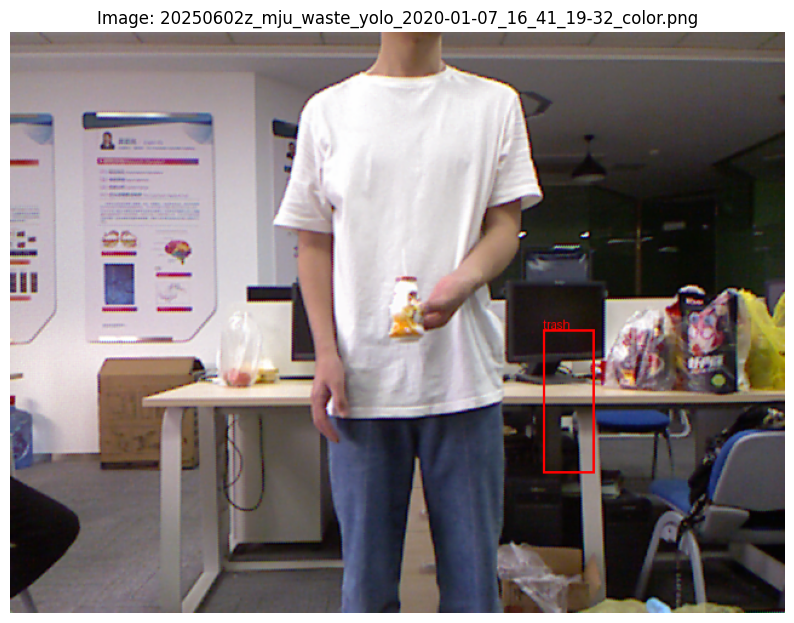

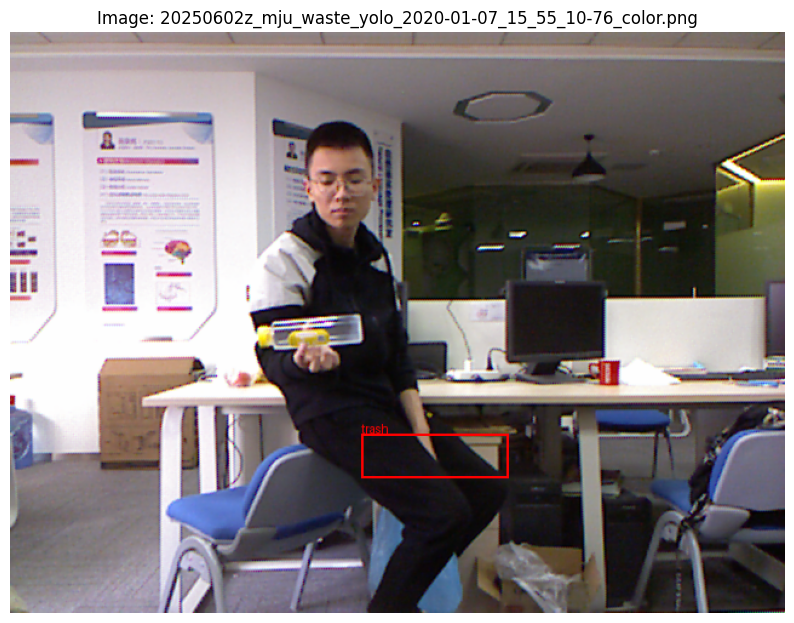

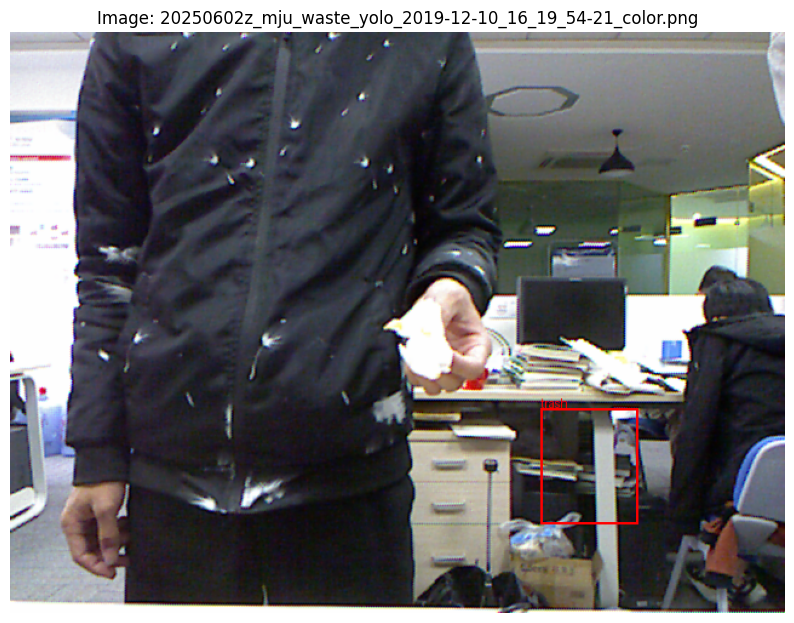

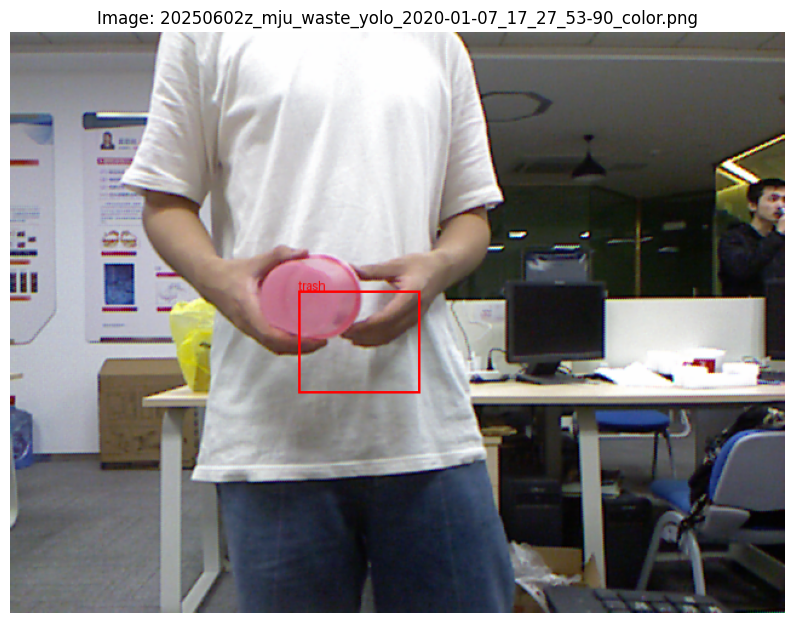

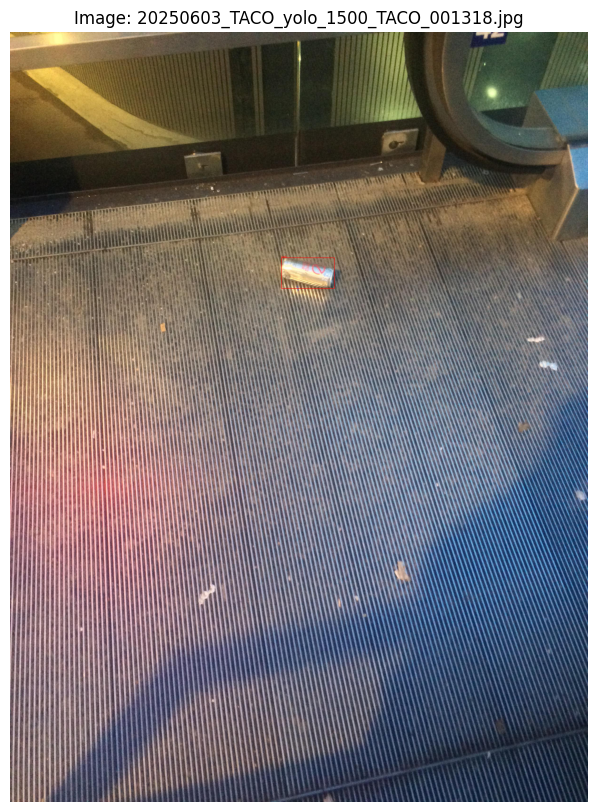


Found 433 image-label pairs in val split.

Displaying batch of 5 samples (index 0 to 4) from the val split.


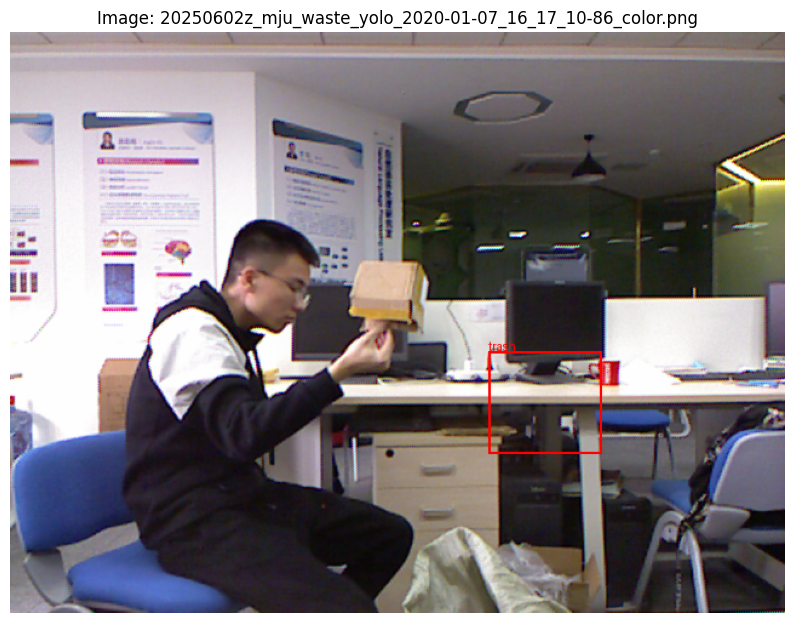

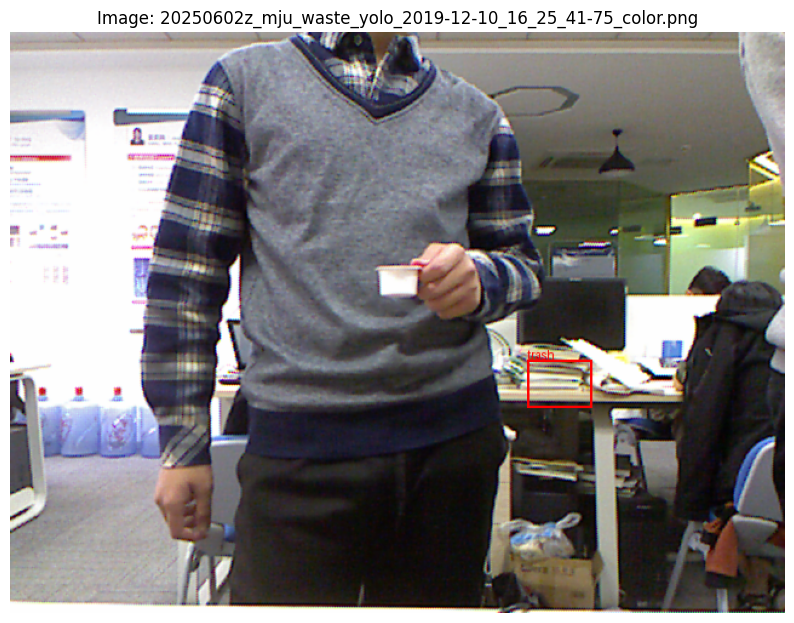

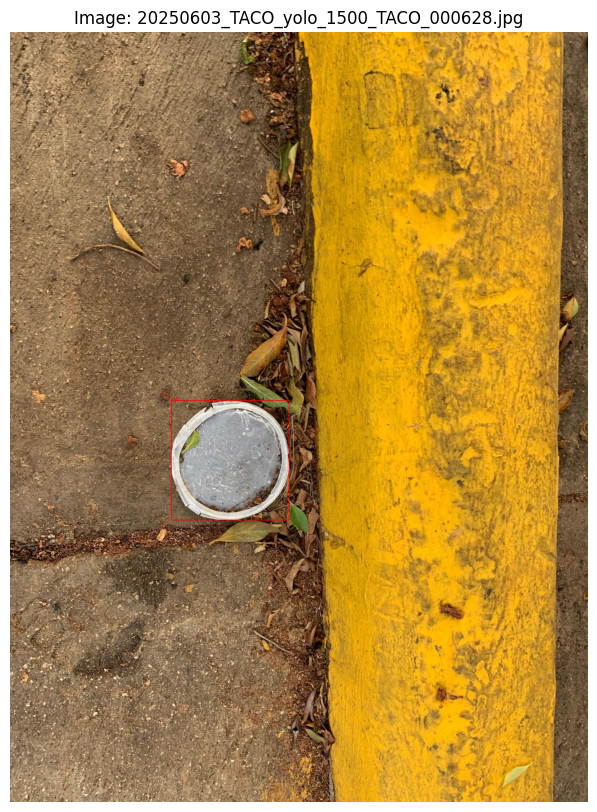

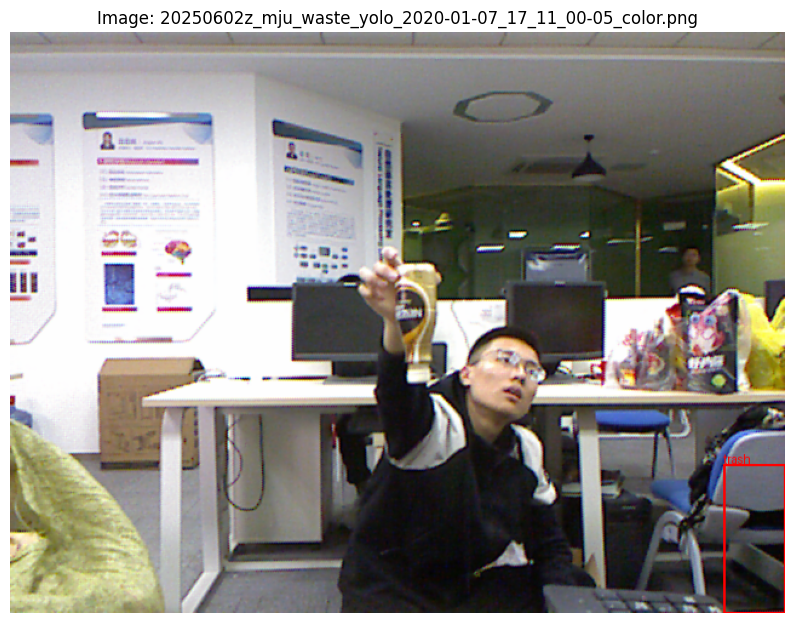

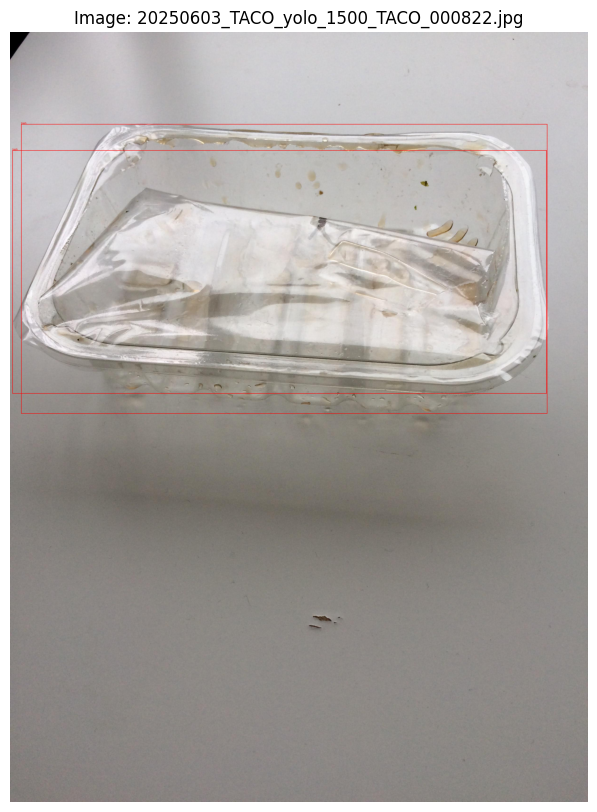


Found 435 image-label pairs in test split.

Displaying batch of 5 samples (index 0 to 4) from the test split.


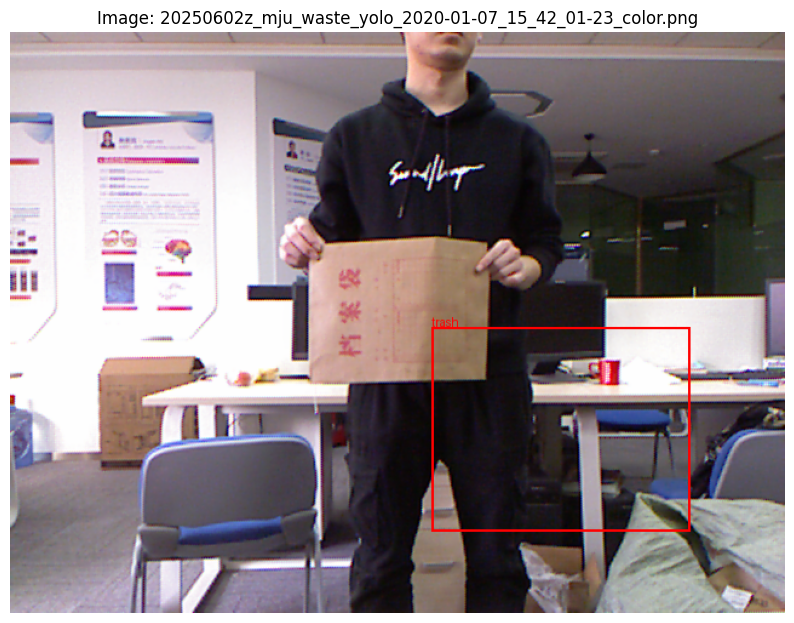

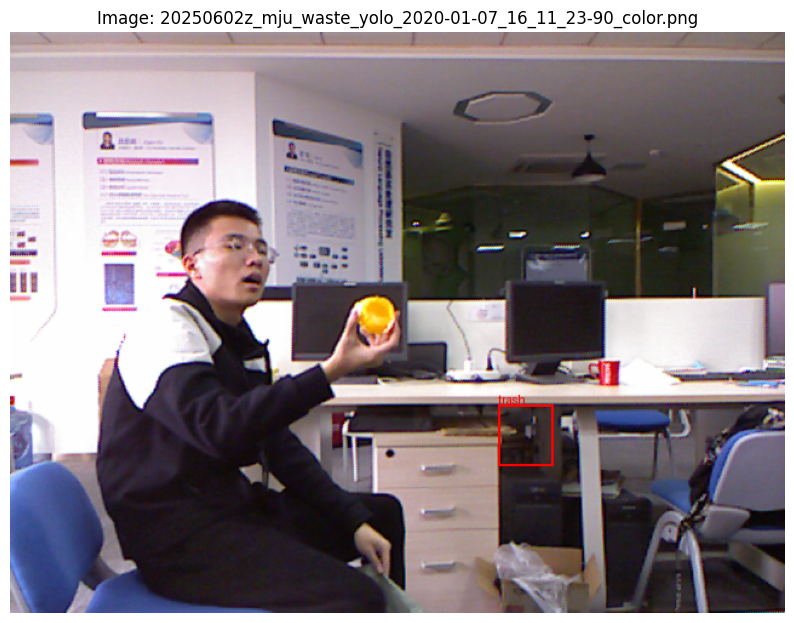

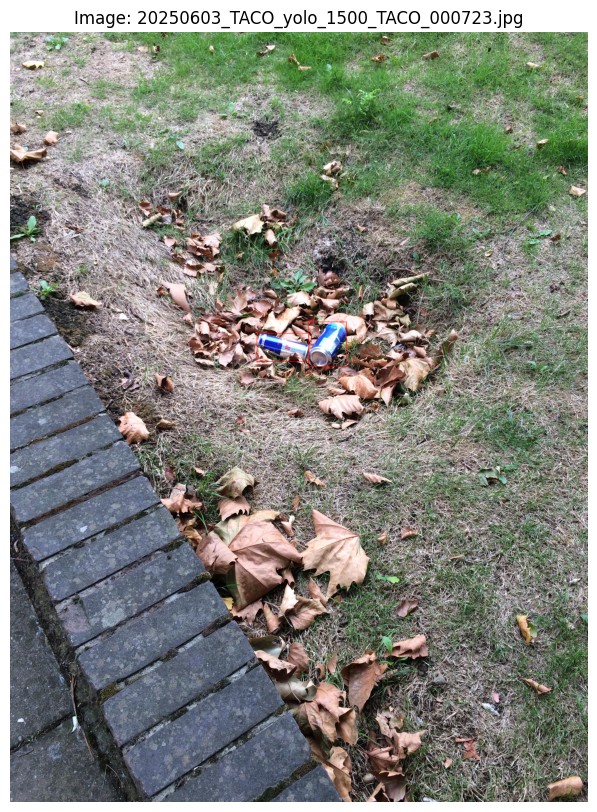

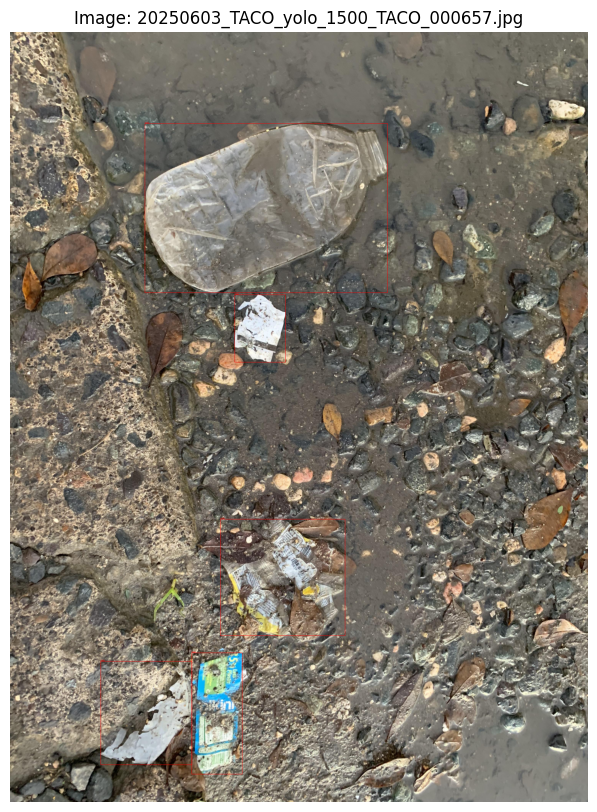

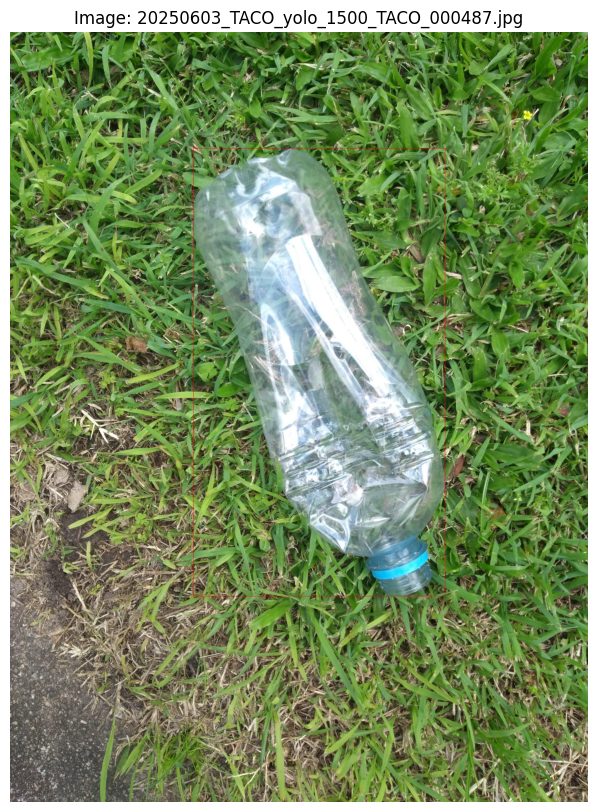


Finished visualization for the current batch.

To view the next batch of 5 images:
1. Change the `start_index` variable in the code cell to 5.
2. Re-run the code cell.


In [21]:
#Inspecting a batch of x image-label pairs at a time

# %%
import os
import random
import yaml
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import numpy as np

# --- Configuration ---
# Path to your merged dataset directory
merged_output_dir = '/content/merged_yolo_dataset_reshuffled' # Ensure this matches your output directory

# List of splits to check
splits_to_check = ['train', 'val', 'test']

# --- Visualization Limit ---
images_per_split_to_display = 5 # Set the maximum number of images to display per split initially
start_index = 0 # Set the starting index for the batch (0 for the first 50, 50 for the next, etc.)

# --- Load Class Names from merged data.yaml ---
merged_data_yaml_path = os.path.join(merged_output_dir, 'data.yaml')
merged_class_names = []

if os.path.exists(merged_data_yaml_path):
    try:
        with open(merged_data_yaml_path, 'r') as f:
            merged_data_yaml = yaml.safe_load(f)
            merged_class_names = merged_data_yaml.get('names', [])
        print(f"Loaded {len(merged_class_names)} class names from data.yaml: {merged_class_names}")
    except Exception as e:
        print(f"Error loading merged data.yaml from {merged_data_yaml_path}: {e}")
        merged_class_names = [] # Fallback to empty list if loading fails
else:
    print(f"Error: Merged data.yaml not found at {merged_data_yaml_path}. Cannot display class names.")
    merged_class_names = []

# --- Function to Draw Bounding Boxes and Display ---
def plot_yolo_boxes(image_path, label_path, class_names):
    try:
        image = Image.open(image_path).convert("RGB")
        draw = ImageDraw.Draw(image)
        width, height = image.size

        with open(label_path, 'r') as f:
            labels = f.readlines()

        # If no labels, just show the image and print a note
        if not labels or all(line.strip() == '' for line in labels):
            print(f"  Info: No annotations found in {os.path.basename(label_path)}. Displaying image only.")
            plt.figure(figsize=(10, 10))
            plt.imshow(image)
            plt.title(f"Image: {os.path.basename(image_path)}")
            plt.axis('off')
            plt.show()
            return # Exit function if no labels

        for label in labels:
            parts = label.strip().split()
            if len(parts) == 5:
                try:
                    class_id = int(parts[0])
                    # YOLO format: class_id center_x center_y width height (normalized)
                    center_x, center_y, box_width, box_height = map(float, parts[1:])

                    # Convert normalized coordinates to pixel coordinates
                    # top_left_x, top_left_y, bottom_right_x, bottom_right_y
                    x_min = int((center_x - box_width / 2) * width)
                    y_min = int((center_y - box_height / 2) * height)
                    x_max = int((center_x + box_width / 2) * width)
                    y_max = int((center_y + box_height / 2) * height)

                    # Ensure coordinates are within image bounds
                    x_min = max(0, x_min)
                    y_min = max(0, y_min)
                    x_max = min(width, x_max)
                    y_max = min(height, y_max)

                    # Get class name
                    class_name = class_names[class_id] if class_id < len(class_names) else f'Unknown Class ID: {class_id}'

                    # Draw rectangle
                    draw.rectangle([(x_min, y_min), (x_max, y_max)], outline="red", width=2)

                    # Draw class name text
                    try:
                        # Use a default font or try to load one
                        font_size = max(10, int(0.02 * height)) # Adjust font size based on image height
                        # Attempt to use a common font or load default
                        try:
                            font = ImageFont.truetype("arial.ttf", font_size)
                        except IOError:
                            try:
                                font = ImageFont.truetype("DejaVuSans.ttf", font_size)
                            except IOError:
                                font = ImageFont.load_default() # Fallback font
                    except Exception as font_e:
                         print(f"  Warning: Could not load specific font for {os.path.basename(image_path)}: {font_e}. Using default.")
                         font = ImageFont.load_default()


                    text = f"{class_name}"
                    # Calculate text bounding box for positioning
                    try:
                        text_bbox = draw.textbbox((0, 0), text, font=font)
                        text_width = text_bbox[2] - text_bbox[0]
                        text_height = text_bbox[3] - text_bbox[1]
                    except NotImplementedError:
                        # Fallback for older Pillow versions or complex text layouts
                        text_size = draw.textsize(text, font=font)
                        text_width, text_height = text_size
                        print(f"  Warning: Using fallback text size calculation for {os.path.basename(image_path)}. Text positioning might be less precise.")


                    # Position the text just above the bounding box
                    text_x = x_min
                    text_y = y_min - text_height - 2 # 2 pixels padding

                    # Ensure text is within image bounds
                    text_x = max(0, text_x)
                    text_y = max(0, text_y)
                    if text_x + text_width > width:
                         text_x = width - text_width # Move text left if it goes off right edge
                    if text_y < 0:
                         text_y = y_min + 2 # Place below if it goes above the image


                    draw.text((text_x, text_y), text, fill="red", font=font)

                except (ValueError, IndexError) as e:
                    print(f"  Warning: Skipping malformed or invalid line in label file {os.path.basename(label_path)}: '{label.strip()}' - Error: {e}")
                    continue # Skip this annotation if parsing fails
            else:
                 print(f"  Warning: Skipping malformed line in label file {os.path.basename(label_path)}: '{label.strip()}'")


        # Display the image using matplotlib
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        plt.title(f"Image: {os.path.basename(image_path)}")
        plt.axis('off')
        plt.show()

    except FileNotFoundError:
        print(f"  Error: Image or label file not found for {os.path.basename(image_path)}")
    except Exception as e:
        print(f"  An error occurred while processing {os.path.basename(image_path)}: {e}")


# --- Collect and Display a Batch of Samples per Split ---
print("\nCollecting and displaying a batch of image-label pairs from each split...")

for split_to_sample in splits_to_check:
    image_dir = os.path.join(merged_output_dir, 'images', split_to_sample)
    label_dir = os.path.join(merged_output_dir, 'labels', split_to_sample)

    image_label_pairs = []

    if os.path.exists(image_dir) and os.path.exists(label_dir):
        print(f"\nCollecting image-label pairs from {split_to_sample} split...")
        # Collect ALL image-label pairs for this split first
        for filename in os.listdir(image_dir):
            img_name, img_ext = os.path.splitext(filename)
            label_filename = img_name + '.txt'
            image_path = os.path.join(image_dir, filename)
            label_path = os.path.join(label_dir, label_filename)

            # Check if corresponding label file exists
            if os.path.exists(label_path):
                image_label_pairs.append({'image': image_path, 'label': label_path})
            # Optional: Uncomment if you want to see warnings for images with missing labels
            # else:
            #      print(f"  Warning: Label file not found for image {filename} in {split_to_sample}.")

        print(f"Found {len(image_label_pairs)} image-label pairs in {split_to_sample} split.")

        # --- Select and Display a Batch ---
        end_index = start_index + images_per_split_to_display
        batch_to_display = image_label_pairs[start_index:end_index]

        if len(batch_to_display) > 0:
            print(f"\nDisplaying batch of {len(batch_to_display)} samples (index {start_index} to {end_index-1}) from the {split_to_sample} split.")
            for sample in batch_to_display:
                plot_yolo_boxes(sample['image'], sample['label'], merged_class_names)
        else:
            print(f"No image-label pairs found in the {split_to_sample} split within the specified range (index {start_index} to {end_index-1}).")

    else:
        print(f"Error: Image or label directory not found for {split_to_sample} split.")
        print(f"Image dir: {image_dir}")
        print(f"Label dir: {label_dir}")

print("\nFinished visualization for the current batch.")

# --- How to View the Next Batch ---
print(f"\nTo view the next batch of {images_per_split_to_display} images:")
print(f"1. Change the `start_index` variable in the code cell to {start_index + images_per_split_to_display}.")
print("2. Re-run the code cell.")